## Assessment 1: Deep Learning

1) Answer all questions.
2) This assessment is open-book. You are allowed to refer to any references including online materials, books, notes, codes, github links, etc.
3) Copy this notebook to your google drive (click **FILE** > **save a copy in Drive**)
4) Upload the answer notebook to your github. 
5) Submit the assessment by sharing the link to your answer notebook. 





**QUESTION 1** 

One day while wandering around a clothing store at KL East Mall, you stumbled upon a pretty girl who is choosing a dress for Hari Raya. It turns out that the girl is visually impaired and had a hard time distinguishing between an abaya and a kebaya. To help people with the similar situation, you then decided to develop an AI system to identify the type of clothes using a Convolutional Neural Networks (ConvNet). In order to train the network, you decide to use the Fashion MNIST dataset which is freely available on Pytorch.


a) Given the problem, what is the most appropriate loss function to use? Justify your answer. **[5 marks]**

*italicized text*
<span style="color:blue">
    ANSWER: the mean-squared error</span>

b) Create and train a ConvNet corresponding to the following CNN architecture (with a modification of the final layer to address the number of classes). Please include **[10 marks]**:

    1) The dataloader to load the train and test datasets.

    2) The model definition (either using sequential method OR pytorch class method).

    3) Define your training loop.

    4) Output the mean accuracy for the whole testing dataset.

    



![pic](https://raw.githubusercontent.com/CUTe-EmbeddedAI/images/main/images/LeNet.png)

In [ ]:
import torch, torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import time
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import glob
import numpy
import random
import torchvision.transforms as transforms

from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
from torchsummary import summary


###############################################
######## THE REST OF YOUR CODES HERE ##########
###############################################
transform = transforms.Compose(
    [transforms.Resize(32),transforms.ToTensor(),
     transforms.Normalize(0.5, 0.5)])

batch_size = 4


trainset = torchvision.datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.FashionMNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

classes = ('T_shirt/top', 'Trouser', 'Pullover', 'Dress',
       'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle_boot')

train_data_size = len(trainloader.dataset)
test_data_size = len(testloader.dataset)

print(train_data_size)
print(test_data_size)

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 10)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        return x

model = CNN() # need to instantiate the network to be used in instance method

# 2. LOSS AND OPTIMIZER
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# 3. move the model to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)



60000
10000


CNN(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=10, bias=True)
  (relu): ReLU()
)

In [ ]:
import time # to calculate training time

def train_and_validate(model, loss_criterion, optimizer, epochs=25):
    '''
    Function to train and validate
    Parameters
        :param model: Model to train and validate
        :param loss_criterion: Loss Criterion to minimize
        :param optimizer: Optimizer for computing gradients
        :param epochs: Number of epochs (default=25)
  
    Returns
        model: Trained Model with best validation accuracy
        history: (dict object): Having training loss, accuracy and validation loss, accuracy
    '''
    
    start = time.time()
    history = []
    best_acc = 0.0

    for epoch in range(epochs):
        epoch_start = time.time()
        print("Epoch: {}/{}".format(epoch+1, epochs))
        
        # Set to training mode
        model.train()
        
        # Loss and Accuracy within the epoch
        train_loss = 0.0
        train_acc = 0.0
        
        valid_loss = 0.0
        valid_acc = 0.0
        
        for i, (inputs, labels) in enumerate(trainloader):

            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Clean existing gradients
            optimizer.zero_grad()
            
            # Forward pass - compute outputs on input data using the model
            outputs = model(inputs)
            
            # Compute loss
            loss = loss_criterion(outputs, labels)
            
            # Backpropagate the gradients
            loss.backward()
            
            # Update the parameters
            optimizer.step()
            
            # Compute the total loss for the batch and add it to train_loss
            train_loss += loss.item() * inputs.size(0)
            
            # Compute the accuracy
            ret, predictions = torch.max(outputs.data, 1)
            correct_counts = predictions.eq(labels.data.view_as(predictions))
            
            # Convert correct_counts to float and then compute the mean
            acc = torch.mean(correct_counts.type(torch.FloatTensor))
            
            # Compute total accuracy in the whole batch and add to train_acc
            train_acc += acc.item() * inputs.size(0)
            
            #print("Batch number: {:03d}, Training: Loss: {:.4f}, Accuracy: {:.4f}".format(i, loss.item(), acc.item()))

            
        # Validation - No gradient tracking needed
        with torch.no_grad():

            # Set to evaluation mode
            model.eval()

            # Validation loop
            for j, (inputs, labels) in enumerate(testloader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Forward pass - compute outputs on input data using the model
                outputs = model(inputs)

                # Compute loss
                loss = loss_criterion(outputs, labels)

                # Compute the total loss for the batch and add it to valid_loss
                valid_loss += loss.item() * inputs.size(0)

                # Calculate validation accuracy
                ret, predictions = torch.max(outputs.data, 1)
                correct_counts = predictions.eq(labels.data.view_as(predictions))

                # Convert correct_counts to float and then compute the mean
                acc = torch.mean(correct_counts.type(torch.FloatTensor))

                # Compute total accuracy in the whole batch and add to valid_acc
                valid_acc += acc.item() * inputs.size(0)

                #print("Validation Batch number: {:03d}, Validation: Loss: {:.4f}, Accuracy: {:.4f}".format(j, loss.item(), acc.item()))
            
        # Find average training loss and training accuracy
        avg_train_loss = train_loss/train_data_size 
        avg_train_acc = train_acc/train_data_size

        # Find average training loss and training accuracy
        avg_test_loss = valid_loss/test_data_size 
        avg_test_acc = valid_acc/test_data_size

        history.append([avg_train_loss, avg_test_loss, avg_train_acc, avg_test_acc])
                
        epoch_end = time.time()
    
        print("Epoch : {:03d}, Training: Loss: {:.4f}, Accuracy: {:.4f}%, \n\t\tValidation : Loss : {:.4f}, Accuracy: {:.4f}%, Time: {:.4f}s".format(epoch, avg_train_loss, avg_train_acc*100, avg_test_loss, avg_test_acc*100, epoch_end-epoch_start))
        
        # Save if the model has best accuracy till now
        torch.save(model, 'fashionMNISt_'+str(epoch)+'.pt')
            
    return model, history

In [ ]:
num_epochs = 10
trained_model, history = train_and_validate(model, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.7446, Accuracy: 72.9450%, 
		Validation : Loss : 0.4225, Accuracy: 84.4500%, Time: 78.8687s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.3553, Accuracy: 86.9300%, 
		Validation : Loss : 0.3597, Accuracy: 87.0300%, Time: 71.7571s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.3075, Accuracy: 88.6150%, 
		Validation : Loss : 0.3251, Accuracy: 88.0000%, Time: 71.5813s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.2827, Accuracy: 89.5367%, 
		Validation : Loss : 0.3082, Accuracy: 88.7900%, Time: 72.4330s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.2645, Accuracy: 90.1367%, 
		Validation : Loss : 0.3174, Accuracy: 88.4500%, Time: 71.5066s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.2499, Accuracy: 90.6200%, 
		Validation : Loss : 0.3040, Accuracy: 89.0100%, Time: 71.1634s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.2380, Accuracy: 90.9967%, 
		Validation : Loss : 0.3018, Accuracy: 89.4200%, Time: 71.2090s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.2266, Accura

c) Replace your defined CNN in b) with a pre-trained model. Then, proceed with a transfer learning and finetune the model for the Fashion MNIST dataset. **[10 marks]**

In [ ]:

model_ft = models.resnet18(weights=True)
num_ftrs=model_ft.fc.in_features
# Here the size of each output sample is set to 10.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, 10)
model_ft = model_ft.to(device)
criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

model_ft.conv1 = nn.Conv2d(1, 64, 7, 2, 3, bias = False)
model_ft = model_ft.to(device)


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [ ]:
num_epochs = 10
trained_model, history = train_and_validate(model_ft, criterion, optimizer_ft, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 1.0564, Accuracy: 66.8600%, 
		Validation : Loss : 0.6096, Accuracy: 79.7100%, Time: 212.1990s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.6365, Accuracy: 79.6233%, 
		Validation : Loss : 0.5425, Accuracy: 82.3300%, Time: 211.5776s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.5282, Accuracy: 83.0083%, 
		Validation : Loss : 0.4715, Accuracy: 84.1500%, Time: 210.1524s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.4849, Accuracy: 84.3983%, 
		Validation : Loss : 0.4610, Accuracy: 86.5700%, Time: 210.4564s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.4168, Accuracy: 86.2600%, 
		Validation : Loss : 0.4041, Accuracy: 87.7100%, Time: 209.1053s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.3835, Accuracy: 87.1300%, 
		Validation : Loss : 0.3854, Accuracy: 87.4300%, Time: 208.9383s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.3493, Accuracy: 88.0633%, 
		Validation : Loss : 0.4180, Accuracy: 86.4600%, Time: 208.8170s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.3267,

d) Using model-centric methods, propose two (2) strategies that can be used to increase the accuracy of the model on the testing dataset. **[5 marks]**


<span style="color:blue">
    Two model-centric techniques that I propose are:Batch normalization method to normalizes the contributions to a layer for every mini-batch and Dropout , randomly zeroes some of the elements of the input tensor with probability p using samples from a Bernoulli distribution. </span>

e) Next, implement the two proposed model-centric techniques for the same problem as in the previous question. **[15 marks]**

In [ ]:

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.batchnorm1 = nn.BatchNorm2d(6)
        self.batchnorm2 = nn.BatchNorm2d(16)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 10)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout()

    def forward(self, x):
        x = self.pool(self.batchnorm1(self.relu(self.conv1(x))))
        x = self.pool(self.batchnorm2(self.relu(self.conv2(x))))
        x = x.view(-1, 16 * 5 * 5)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        return x

model = CNN() # need to instantiate the network to be used in instance method

# 2. LOSS AND OPTIMIZER
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# 3. move the model to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)



CNN(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (batchnorm1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=10, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [ ]:
num_epochs = 10
trained_model, history = train_and_validate(model, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.5350, Accuracy: 80.9717%, 
		Validation : Loss : 0.3642, Accuracy: 86.6200%, Time: 74.5944s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.3871, Accuracy: 86.1083%, 
		Validation : Loss : 0.3269, Accuracy: 88.0500%, Time: 75.9975s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.3488, Accuracy: 87.4333%, 
		Validation : Loss : 0.3017, Accuracy: 89.0200%, Time: 75.6745s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.3242, Accuracy: 88.3183%, 
		Validation : Loss : 0.2980, Accuracy: 89.1700%, Time: 75.7175s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.3087, Accuracy: 88.9133%, 
		Validation : Loss : 0.2930, Accuracy: 89.1700%, Time: 76.0372s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.2962, Accuracy: 89.1867%, 
		Validation : Loss : 0.2795, Accuracy: 89.8500%, Time: 76.5656s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.2876, Accuracy: 89.4983%, 
		Validation : Loss : 0.2835, Accuracy: 89.5900%, Time: 76.1126s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.2798, Accura

f) Do you see any accuracy improvement? Whether it is a "yes" or "no", discuss the possible reasons contributing to the accuracy improvement/ unimprovement. **[5 marks]**

<span style="color:blue">
    Yes, by the increament of 0.55%. Batch normalization just like their name they normalize the output of previous layer. It helps for the model to converge better. Dropout on the other hand reduces overfitting by blocking off a fraction of neurons in a layer during training to help with the accuracy </span>

g) In real applications, data-centric strategies are essential to train robust deep learning models. Give two (2) examples of such strategies and discuss how the strategies helps improving the model accuracy. **[5 marks]**

<span style="color:blue"> 
1. Data Augmentation: the fundamental is to add slightly modified copies of already existing data or newly created synthetic data from existing data. This will help to increase amount of data.
2. Data MixUp: combines different features of data from different classes. This is to train the model to learn more and able to think complex. </span>

h) Next, implement the two proposed data-centric techniques for the same problem as in the previous question. **[10 marks]**

In [ ]:
###############################################
##############YOUR CODES HERE #################
###############################################
#ii. Data Augmentation: image transforms

transform = transforms.Compose([transforms.RandomRotation(degrees=15),
                                transforms.RandomHorizontalFlip(),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

# Download and load the training data
trainset = datasets.FashionMNIST('./data', download=True, train=True, transform=transforms)
train_loader = DataLoader(trainset, batch_size=64, shuffle=True)

# Download and load the test data
testset = datasets.FashionMNIST('./data', download=True, train=False, transform=transforms)
test_loader = DataLoader(testset, batch_size=64, shuffle=True)

# classes of fashion mnist dataset
classes = ['T-shirt/top','Trouser','Pullover','Dress','Coat','Sandal','Shirt','Sneaker','Bag','Ankle Boot']

train_data_size = len(train_loader.dataset)
test_data_size = len(test_loader.dataset)

print(train_data_size)
print(test_data_size)


60000
10000


In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.batchnorm1 = nn.BatchNorm2d(6)
        self.batchnorm2 = nn.BatchNorm2d(16)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 10)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout()

    def forward(self, x):
        x = self.pool(self.batchnorm1(self.relu(self.conv1(x))))
        x = self.pool(self.batchnorm2(self.relu(self.conv2(x))))
        x = x.view(-1, 16 * 5 * 5)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        return x

In [ ]:
model = CNN() # need to instantiate the network to be used in instance method

# 2. LOSS AND OPTIMIZER
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# 3. move the model to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)

CNN(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (batchnorm1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=400, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=10, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [ ]:
num_epochs = 10
trained_model, history = train_and_validate(model, criterion, optimizer, num_epochs)

Epoch: 1/10
Epoch : 000, Training: Loss: 0.5261, Accuracy: 81.2067%, 
		Validation : Loss : 0.3745, Accuracy: 86.1800%, Time: 74.9911s
Epoch: 2/10
Epoch : 001, Training: Loss: 0.3809, Accuracy: 86.2100%, 
		Validation : Loss : 0.3405, Accuracy: 87.1100%, Time: 74.9024s
Epoch: 3/10
Epoch : 002, Training: Loss: 0.3417, Accuracy: 87.8400%, 
		Validation : Loss : 0.3052, Accuracy: 88.9100%, Time: 74.7067s
Epoch: 4/10
Epoch : 003, Training: Loss: 0.3173, Accuracy: 88.4583%, 
		Validation : Loss : 0.2977, Accuracy: 89.3200%, Time: 75.2521s
Epoch: 5/10
Epoch : 004, Training: Loss: 0.3025, Accuracy: 89.0850%, 
		Validation : Loss : 0.2959, Accuracy: 89.4000%, Time: 74.9805s
Epoch: 6/10
Epoch : 005, Training: Loss: 0.2908, Accuracy: 89.4750%, 
		Validation : Loss : 0.2822, Accuracy: 89.6200%, Time: 74.7083s
Epoch: 7/10
Epoch : 006, Training: Loss: 0.2794, Accuracy: 89.7983%, 
		Validation : Loss : 0.2846, Accuracy: 89.5600%, Time: 74.8710s
Epoch: 8/10
Epoch : 007, Training: Loss: 0.2728, Accura

**QUESTION 2** **[35 marks]**

Firstly, watch this video:

https://drive.google.com/file/d/1bsypahR7I3f_R3DXkfw_tf0BrbCHxE_O/view?usp=sharing

This video shows an example of masked face recognition where the deep learning model is able to detect and classify your face even when wearing a face mask. Using the end-to-end object detection pipeline that you have learned, develop your own masked face recognition such that the model should recognize your face even on face mask while recognize other persons as "others".

Deliverables for this question are:

- the model file. Change the name to <your_name>.pt file (e.g. hasan.pt).
- a short video (~10 secs) containing your face and your friends faces (for inference).

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13595, done.
remote: Counting objects: 100% (397/397), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 13595 (delta 286), reused 329 (delta 223), pack-reused 13198
Receiving objects: 100% (13595/13595), 13.21 MiB | 22.73 MiB/s, done.
Resolving deltas: 100% (9347/9347), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 7.0 MB/s 
     |████████████████████████████████| 145 kB 7.1 MB/s 
     |████████████████████████████████| 178 kB 52.2 MB/s 
     |████████████████████████████████| 1.1 MB 69.5 MB/s 
     |████████████████████████████████| 67 kB 5.1 MB/s 
     |████████████████████████████████| 54 kB 3.1 MB/s 
     |████████████████████████████████| 138 kB 73.6 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="w5TbWlPoEWPllkL7EUAz")
project = rf.workspace("deep-learning-qbyqu").project("assesment1")
dataset = project.version(3).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Assesment1-3 in yolov5pytorch:: 100%|██████████| 1016/1016 [00:00<00:00, 1515.49it/s]


In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Assesment1-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/ultralytics/yolov5
   48e8a52..f560cdf  exp8       -> origin/exp8
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOL

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Assesment1-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/22 /content/datasets/Assesment1-3/test/images/Omar-Borkan-Al-Gala_jpg.rf.720890e525a07fb5e21aff797f24a480.jpg: 416x416 2 Otherss, 8.2ms
image 2/22 /content/datasets/Assesment1-3/test/images/WIN_20221007_09_38_29_Pro--3-_jpg.rf.95f826117e483cea6686e207abaa9cb1.jpg: 416x416 1 Me, 1 Others, 8.2ms
image 3/22 /content/d

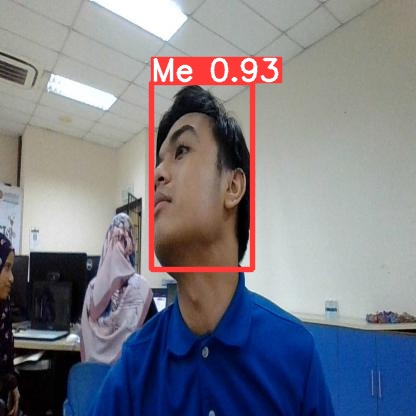

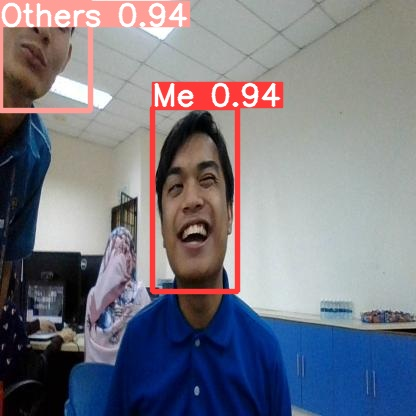

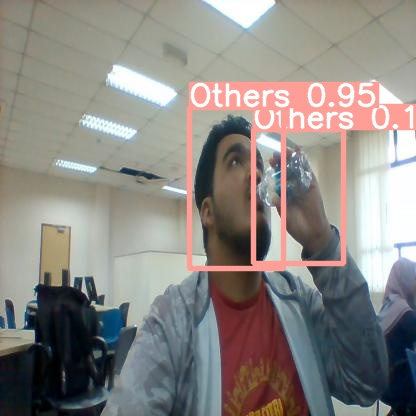

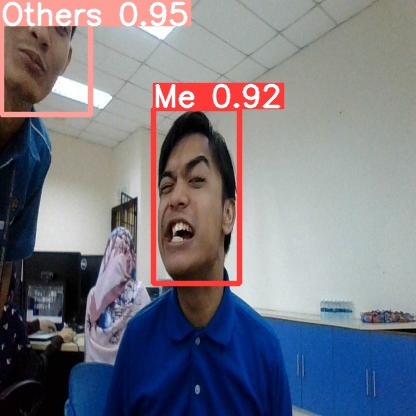

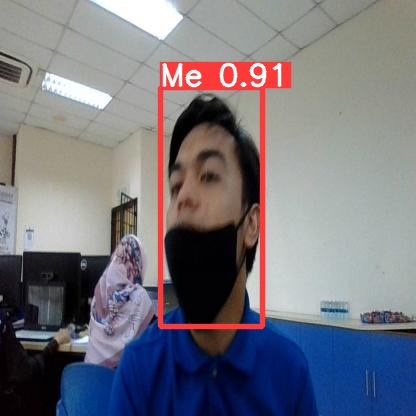

...

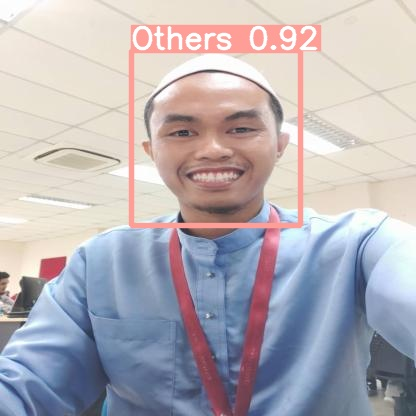

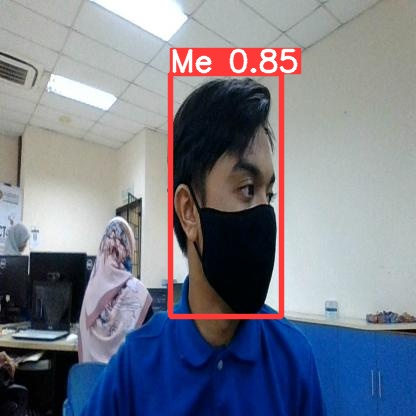

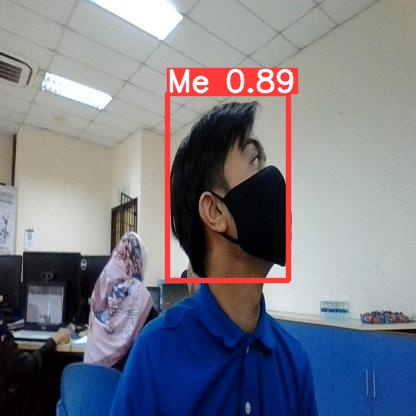

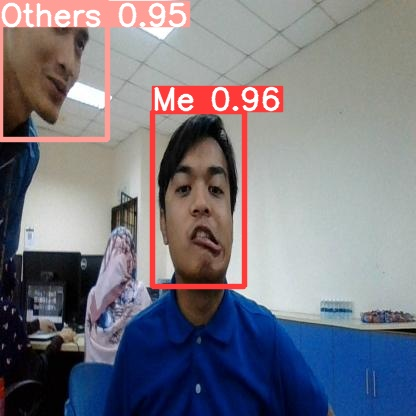

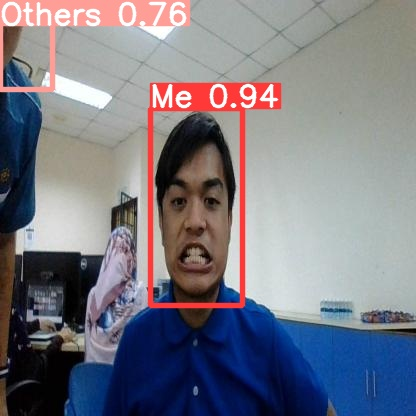

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")